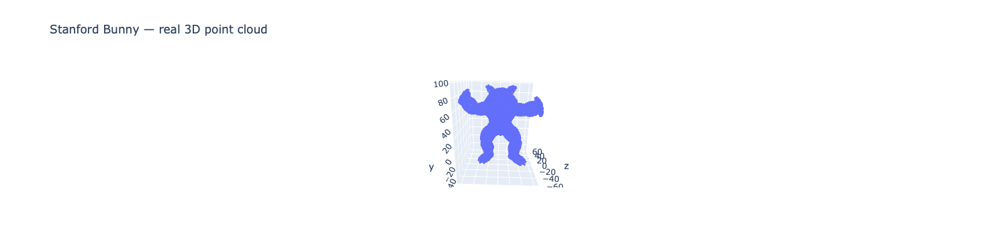

In [8]:
# pip install open3d umap-learn plotly scikit-learn

import numpy as np, open3d as o3d
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap, plotly.graph_objects as go
from plotly.subplots import make_subplots

armadillo = o3d.data.ArmadilloMesh()
mesh = o3d.io.read_triangle_mesh(armadillo.path)
mesh.compute_vertex_normals()
pcd = mesh.sample_points_poisson_disk(4000)
X = np.asarray(pcd.points)


# 3) Plot original 3D with Plotly
fig3d = go.Figure([go.Scatter3d(x=X[:,0], y=X[:,1], z=X[:,2],
                                mode='markers', marker=dict(size=2, opacity=0.9))])
fig3d.update_layout(title="Stanford Bunny — real 3D point cloud", height=600)
fig3d.show()

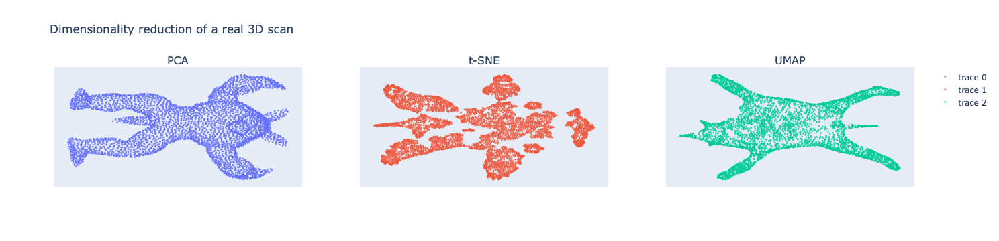

In [9]:
# 4) Reduce to 2D (PCA / t-SNE / UMAP)
X_pca  = PCA(n_components=2, ).fit_transform(X)
X_tsne = TSNE(n_components=2, init="pca",
              learning_rate="auto", ).fit_transform(X)
X_umap = umap.UMAP().fit_transform(X)

# 5) Side-by-side Plotly comparison
fig2d = make_subplots(rows=1, cols=3, subplot_titles=("PCA", "t-SNE", "UMAP"))
for i, Y in enumerate([X_pca, X_tsne, X_umap], 1):
    fig2d.add_trace(go.Scatter(x=Y[:,0], y=Y[:,1], mode="markers",
                               marker=dict(size=3, opacity=0.8)), row=1, col=i)
fig2d.update_xaxes(visible=False); fig2d.update_yaxes(visible=False)
fig2d.update_layout(height=450, title="Dimensionality reduction of a real 3D scan")
fig2d.show()

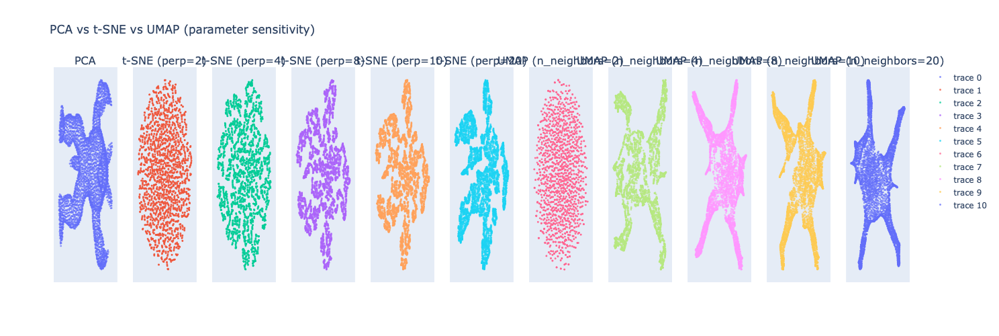

In [22]:

# ---- PCA (référence) ----
X_pca = PCA(n_components=2, ).fit_transform(X)

# ---- t-SNE avec différentes perplexities ----
perplexities = [2, 4, 8, 10, 20]
tsne_results = {}
for perp in perplexities:
    tsne = TSNE(n_components=2, perplexity=perp,
                learning_rate="auto", init="pca", )
    tsne_results[perp] = tsne.fit_transform(X)

# ---- UMAP avec différents n_neighbors ----
neighbors_list = [2, 4, 8, 10, 20]
umap_results = {}
for k in neighbors_list:
    reducer = umap.UMAP(n_neighbors=k, min_dist=0.1, )
    umap_results[k] = reducer.fit_transform(X)

# ---- Plotly subplot grid ----
# 1 row, 1 (PCA) + len(perplexities) + len(neighbors_list) columns
ncols = 1 + len(perplexities) + len(neighbors_list)
titles = (["PCA"] +
          [f"t-SNE (perp={p})" for p in perplexities] +
          [f"UMAP (n_neighbors={k})" for k in neighbors_list])

fig = make_subplots(rows=1, cols=ncols, subplot_titles=titles)

# PCA
fig.add_trace(go.Scatter(x=X_pca[:,0], y=X_pca[:,1], mode="markers",
                         marker=dict(size=3, opacity=0.7)),
              row=1, col=1)

# t-SNE
for i, perp in enumerate(perplexities, start=2):
    Y = tsne_results[perp]
    fig.add_trace(go.Scatter(x=Y[:,0], y=Y[:,1], mode="markers",
                             marker=dict(size=3, opacity=0.7)),
                  row=1, col=i)

# UMAP
for j, k in enumerate(neighbors_list, start=2+len(perplexities)):
    Y = umap_results[k]
    fig.add_trace(go.Scatter(x=Y[:,0], y=Y[:,1], mode="markers",
                             marker=dict(size=3, opacity=0.7)),
                  row=1, col=j)

fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(height=500, width=300*ncols,
                  title_text="PCA vs t-SNE vs UMAP (parameter sensitivity)")
fig.show()


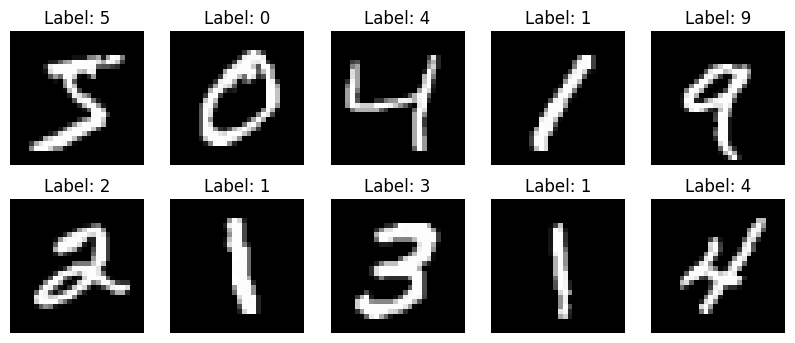

In [11]:
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import mnist

# Charger MNIST
(X_train, y_train), (_, _) = mnist.load_data()

# Afficher quelques exemples
fig, axes = plt.subplots(2, 5, figsize=(10,4))
for i, ax in enumerate(axes.flat):
    ax.imshow(X_train[i], cmap="gray")
    ax.set_title(f"Label: {y_train[i]}")
    ax.axis("off")
plt.show()


Running t-SNE with perplexity=5...
Running t-SNE with perplexity=30...
Running t-SNE with perplexity=31...
Running t-SNE with perplexity=50...
Running t-SNE with perplexity=100...


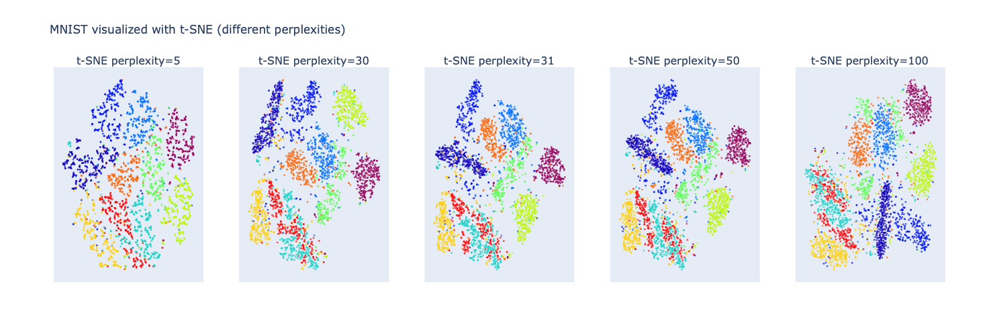

In [5]:
# !pip install tensorflow scikit-learn plotly

import numpy as np
from sklearn.manifold import TSNE
from tensorflow.keras.datasets import mnist
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# ---- 1. Charger MNIST ----
(X_train, y_train), (_, _) = mnist.load_data()
X = X_train.reshape((X_train.shape[0], -1))  # flatten 28x28 -> 784
y = y_train

# Sous-échantillonner pour la rapidité
n_samples = 3000
X_subset = X[:n_samples]
y_subset = y[:n_samples]

# ---- 2. Tester plusieurs perplexities ----
perplexities = [5, 30, 31, 50, 100]
results = {}

for p in perplexities:
    print(f"Running t-SNE with perplexity={p}...")
    tsne = TSNE(n_components=2, perplexity=p,
                learning_rate="auto", init="pca",
                )
    results[p] = tsne.fit_transform(X_subset)

# ---- 3. Affichage côte à côte avec Plotly ----
fig = make_subplots(rows=1, cols=len(perplexities),
                    subplot_titles=[f"t-SNE perplexity={p}" for p in perplexities])

for i, p in enumerate(perplexities, start=1):
    emb = results[p]
    fig.add_trace(
        go.Scatter(
            x=emb[:,0], y=emb[:,1],
            mode="markers",
            marker=dict(
                color=y_subset,
                colorscale="Rainbow",
                size=3,
                opacity=0.7
            ),
            showlegend=False
        ),
        row=1, col=i
    )

fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(height=500, width=300*len(perplexities),
                  title="MNIST visualized with t-SNE (different perplexities)")
fig.show()


Running t-SNE (perplexity=5)...
Running t-SNE (perplexity=30)...
Running t-SNE (perplexity=50)...
Running UMAP (n_neighbors=5)...
Running UMAP (n_neighbors=15)...
Running UMAP (n_neighbors=50)...


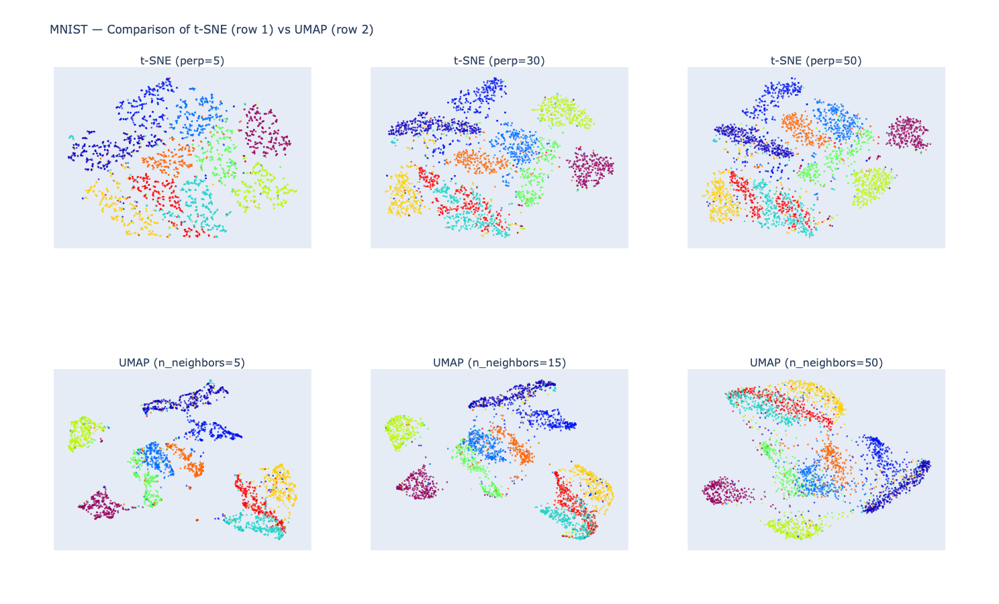

In [23]:
# !pip install tensorflow scikit-learn umap-learn plotly

import numpy as np
from sklearn.manifold import TSNE
import umap
from tensorflow.keras.datasets import mnist
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# ---- 1. Charger MNIST ----
(X_train, y_train), (_, _) = mnist.load_data()
X = X_train.reshape((X_train.shape[0], -1))  # flatten 28x28 -> 784
y = y_train

# Sous-échantillonner pour rapidité
n_samples = 3000
X_subset = X[:n_samples]
y_subset = y[:n_samples]

# ---- 2. t-SNE avec plusieurs perplexities ----
perplexities = [5, 30, 50]
tsne_results = {}
for p in perplexities:
    print(f"Running t-SNE (perplexity={p})...")
    tsne = TSNE(n_components=2, perplexity=p,
                learning_rate="auto", init="pca",
                )
    tsne_results[p] = tsne.fit_transform(X_subset)

# ---- 3. UMAP avec plusieurs n_neighbors ----
neighbors_list = [5, 15, 50]
umap_results = {}
for k in neighbors_list:
    print(f"Running UMAP (n_neighbors={k})...")
    reducer = umap.UMAP(n_neighbors=k, )
    umap_results[k] = reducer.fit_transform(X_subset)

# ---- 4. Grille Plotly ----
ncols = max(len(perplexities), len(neighbors_list))
fig = make_subplots(
    rows=2, cols=ncols,
    subplot_titles=[f"t-SNE (perp={p})" for p in perplexities] +
                   [f"UMAP (n_neighbors={k})" for k in neighbors_list]
)

# Ligne 1 : t-SNE
for i, p in enumerate(perplexities, start=1):
    emb = tsne_results[p]
    fig.add_trace(
        go.Scatter(
            x=emb[:,0], y=emb[:,1],
            mode="markers",
            marker=dict(color=y_subset, colorscale="Rainbow",
                        size=3, opacity=0.7),
            showlegend=False
        ), row=1, col=i
    )

# Ligne 2 : UMAP
for j, k in enumerate(neighbors_list, start=1):
    emb = umap_results[k]
    fig.add_trace(
        go.Scatter(
            x=emb[:,0], y=emb[:,1],
            mode="markers",
            marker=dict(color=y_subset, colorscale="Rainbow",
                        size=3, opacity=0.7),
            showlegend=False
        ), row=2, col=j
    )

fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(
    height=900, width=300*ncols,
    title="MNIST — Comparison of t-SNE (row 1) vs UMAP (row 2)"
)
fig.show()
